# Test Particle Motion in Elliptic Potential

Describes the motion of a test particle in an elliptic potential with homogenous density following 
W. M. MacMillan, The Theory of the Potential, McGraw--Hill (1930), pp. 50-51


In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.offline as pyo

In [2]:
from scipy.integrate import quad, solve_ivp

In [3]:
# Set notebook mode to work in offline
pyo.init_notebook_mode()

In [4]:
#!/usr/bin/env python3
"""
Homogeneous ellipsoid interior gravity:
1) Compute ellipsoidal coefficients A_x, A_y, A_z via 1D quadrature
2) Solve interior equations of motion: x¨ + ωx^2 x = 0, etc.
   where ωi^2 = 2π G ρ A_i

Units:
- a,b,c in meters (or any length unit)
- ρ in kg/m^3 (or consistent with G)
- G in SI by default
Time output in seconds.

Dependencies: numpy, scipy
"""

from __future__ import annotations

import numpy as np
from dataclasses import dataclass
from typing import Callable, Tuple

from scipy.integrate import quad, solve_ivp


#G_SI = 6.67430e-11  # m^3 kg^-1 s^-2


def _Delta(lam: float, a: float, b: float, c: float) -> float:
    """Δ(λ) = sqrt((a^2+λ)(b^2+λ)(c^2+λ))."""
    return np.sqrt((a * a + lam) * (b * b + lam) * (c * c + lam))


def compute_A_coeffs(a: float, b: float, c: float, *, epsabs: float = 1e-12, epsrel: float = 1e-10
                    ) -> Tuple[float, float, float]:
    """
    Compute (A_x, A_y, A_z) for a homogeneous ellipsoid with semiaxes (a,b,c).

    Definitions:
      A_x = abc ∫_0^∞ dλ / ((a^2+λ) Δ(λ)), etc.

    Notes:
    - A_x + A_y + A_z = 2 (use as a check).
    - For a sphere: A_x = A_y = A_z = 2/3.
    """

    abc = a * b * c

    def integrand_x(lam: float) -> float:
        return abc / ((a * a + lam) * _Delta(lam, a, b, c))

    def integrand_y(lam: float) -> float:
        return abc / ((b * b + lam) * _Delta(lam, a, b, c))

    def integrand_z(lam: float) -> float:
        return abc / ((c * c + lam) * _Delta(lam, a, b, c))

    # quad supports infinite upper limit directly
    Ax, Ax_err = quad(integrand_x, 0.0, np.inf, epsabs=epsabs, epsrel=epsrel, limit=200)
    Ay, Ay_err = quad(integrand_y, 0.0, np.inf, epsabs=epsabs, epsrel=epsrel, limit=200)
    Az, Az_err = quad(integrand_z, 0.0, np.inf, epsabs=epsabs, epsrel=epsrel, limit=200)

    return Ax, Ay, Az

In [5]:
a=1.6
b=1.2
c=1

abc = a * b * c

def integrand_x(lam: float) -> float:
    return abc / ((a * a + lam) * _Delta(lam, a, b, c))

def integrand_y(lam: float) -> float:
    return abc / ((b * b + lam) * _Delta(lam, a, b, c))

def integrand_z(lam: float) -> float:
    return abc / ((c * c + lam) * _Delta(lam, a, b, c))

In [6]:
epsabs=1E-6
epsrel=1E-5

In [7]:
Ax, Ax_err = quad(integrand_x, 0.0, np.inf, epsabs=epsabs, epsrel=epsrel, limit=2000)
Ay, Ay_err = quad(integrand_y, 0.0, np.inf, epsabs=epsabs, epsrel=epsrel, limit=2000)
Az, Az_err = quad(integrand_z, 0.0, np.inf, epsabs=epsabs, epsrel=epsrel, limit=2000)


In [8]:
print(Ax,Ay,Az)
print(Ax+Ay+Az)

0.4766460096243992 0.6820996237513766 0.841254366623921
1.9999999999996967


In [9]:

def orbits(t,x0,y0,z0,vx0,vy0,vz0,wx2,wy2,wz2):
    # angular frequencies (handle potential tiny numerical negatives)
    wx = np.sqrt(wx2)
    wy = np.sqrt(wy2)
    wz = np.sqrt(wz2)
    
    def one_axis(pos0: float, vel0: float, w: float) -> Tuple[np.ndarray, np.ndarray]:
        if w == 0.0:
            # Degenerate: free particle along that axis
            pos = pos0 + vel0 * t
            vel = np.full_like(t, vel0, dtype=float)
        else:
            pos = pos0 * np.cos(w * t) + (vel0 / w) * np.sin(w * t)
            vel = -pos0 * w * np.sin(w * t) + vel0 * np.cos(w * t)
        return pos, vel
    
    x, vx = one_axis(x0, vx0, wx)
    y, vy = one_axis(y0, vy0, wy)
    z, vz = one_axis(z0, vz0, wz)
    #print(np.array([x,y,z]).T)
    h=np.cross(np.array([x,y,z]).T,np.array([vx,vy,vz]).T,axisa=1,axisb=1)
    #print(h)
    
    state = np.column_stack([t, x, y, z, vx, vy, vz, h])
    return state

In [10]:
t=np.arange(0,2000,0.05)

In [11]:
res=orbits(t,1,0.5,0.5,np.sqrt(Ax),np.sqrt(Ay),np.sqrt(Az),Ax,Ay,Az)

In [12]:
df = pd.DataFrame(res,columns=['t','x','y','z','vx','vy','vz','hx','hy','hz'])

In [13]:
df

,t,x,y,z,vx,vy,vz,hx,hy,hz
0,0.00,1.000000,0.500000,0.500000,0.690396,0.825893,0.917199,0.045653,-0.572001,0.480695
1,0.05,1.033917,0.540857,0.545318,0.666157,0.808142,0.895211,0.043487,-0.562307,0.475256
2,0.10,1.066602,0.580791,0.589490,0.641124,0.789012,0.871340,0.040952,-0.551437,0.469203
3,0.15,1.098017,0.619735,0.632422,0.615328,0.768537,0.845637,0.038032,-0.539377,0.462526
4,0.20,1.128123,0.657623,0.674024,0.588798,0.746752,0.818156,0.034710,-0.526117,0.455221
...,...,...,...,...,...,...,...,...,...,...
39995,1999.75,-1.105041,-0.470244,-0.064105,0.609305,0.837730,1.023773,-0.427721,1.092251,-0.639204
39996,1999.80,-1.073923,-0.427969,-0.012866,0.635272,0.853049,1.025392,-0.427860,1.093018,-0.644232
39997,1999.85,-1.041526,-0.384964,0.038399,0.660483,0.866914,1.024855,-0.427820,1.092775,-0.648651
39998,1999.90,-1.007888,-0.341302,0.089583,0.684907,0.879300,1.022163,-0.427637,1.091582,-0.652476


In [14]:
df['theta']=np.acos(np.abs(df['hx']/np.sqrt((df['hx']**2+df['hy']**2+df['hz']**2))))

In [15]:
theta=2/np.pi*df['theta'].mean()
print(theta)

0.660250310412624


<Axes: >

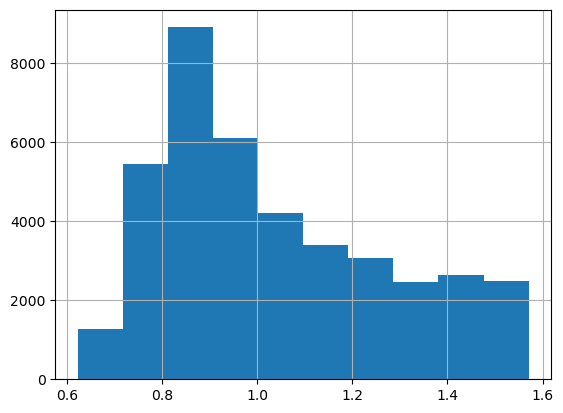

In [16]:
df['theta'].hist()


In [17]:
df['theta'].std()

np.float64(0.23752449521968136)

In [18]:
h=[]
for index, row in df.iterrows():
    xx=np.array(row[['x','y','z']])
    vv=np.array(row[['vx','vy','vz']])
    h.append(np.cross(xx, vv))

In [19]:
dfh=pd.DataFrame(h,columns=['hx','hy','hz'])

In [20]:
dfh

,hx,hy,hz
0,0.045653,-0.572001,0.480695
1,0.043487,-0.562307,0.475256
2,0.040952,-0.551437,0.469203
3,0.038032,-0.539377,0.462526
4,0.034710,-0.526117,0.455221
...,...,...,...
39995,-0.427721,1.092251,-0.639204
39996,-0.427860,1.093018,-0.644232
39997,-0.427820,1.092775,-0.648651
39998,-0.427637,1.091582,-0.652476


In [21]:
fig = px.scatter_3d(df,x='x',y='y',z='z')
fig.update_traces(marker={'size': 2})
fig.show()

In [22]:
fig = px.scatter_3d(df,x='hx',y='hy',z='hz')
fig.update_traces(marker={'size': 2})
fig.show()

In [23]:
dfh['hx']

0        0.045653
1        0.043487
2        0.040952
3        0.038032
4        0.034710
           ...   
39995   -0.427721
39996   -0.427860
39997   -0.427820
39998   -0.427637
39999   -0.427346
Name: hx, Length: 40000, dtype: float64